This notebook is dedicated to plotting and analyzing results of mutliple frames from a N-MPCD simulation.
It contains code for loading models and data, visualizing predictions, and producing figures using Matplotlib and Seaborn.
Data manipulation and model evaluation are performed for the purpose of better understanding experimental outcomes, such as those generated by simulations in the MAI_U100_L_128_A dataset. The overall aim is to facilitate exploration and interpretation of the experiments through rich visualizations and summaries.

_Description generated automatically using Generative AI and reviewed manually by the author


In [1]:
import sys
import os
import numpy as np
import torch
sys.path.append(os.path.abspath(".."))
import utils.project_functions as pf
import utils.project_classes as pc
import warnings
warnings.simplefilter('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import label, center_of_mass
import vtk
import pandas as pd
import time
import plotly.graph_objects as go


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


model = pf.load_model(file_path="../Models/cnn_2025-08-12.pth")



In [4]:
# Style 
plt.rcParams['font.size'] = 16
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["cmr10"]

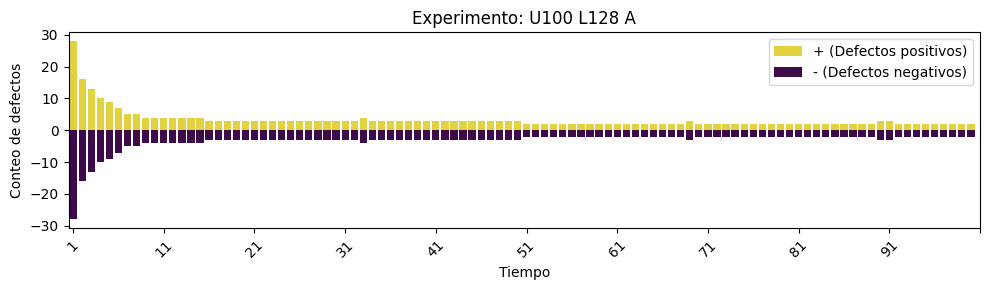

In [ ]:
## Plot the timeline of the number of defects for the first 100 frames using only the winding number
frames = range(1,101)
file_name = "../Data/MAI_U100_L_128_A/mpcd_{}.vtk"

predictions_df = pd.DataFrame(columns=["x","y","prediction","confidence","tag","frame"])


for frame in frames:
    try:
        eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name.format(frame), pad_width=4)
    except:
        print(f"File not found: {file_name.format(frame)}")
        continue

    winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
    winding_numbers *= -1
    centroids = pf.find_candidates_by_winding_number(winding_numbers)
    defects = np.round([(c[0], c[1]) for c in centroids]).astype(int)
    labels = [ 1 if winding_numbers[i,j] > 0 else 0 for i,j in defects] 
    predictions = pd.DataFrame(list(zip(defects[:,0], defects[:,1], labels)), columns=["x","y","prediction"])
    predictions["confidence"] = 1
    predictions["tag"] = "U100 L128 A"
    predictions["frame"] = frame

    predictions_df = pd.concat([predictions_df, predictions])

predictions_df["frame"] = predictions_df["frame"].astype(int)

pf.plot_experiments_evolution(predictions_df)


This block of code is used to plot a specific frame with different visualization options, toggling them with comments

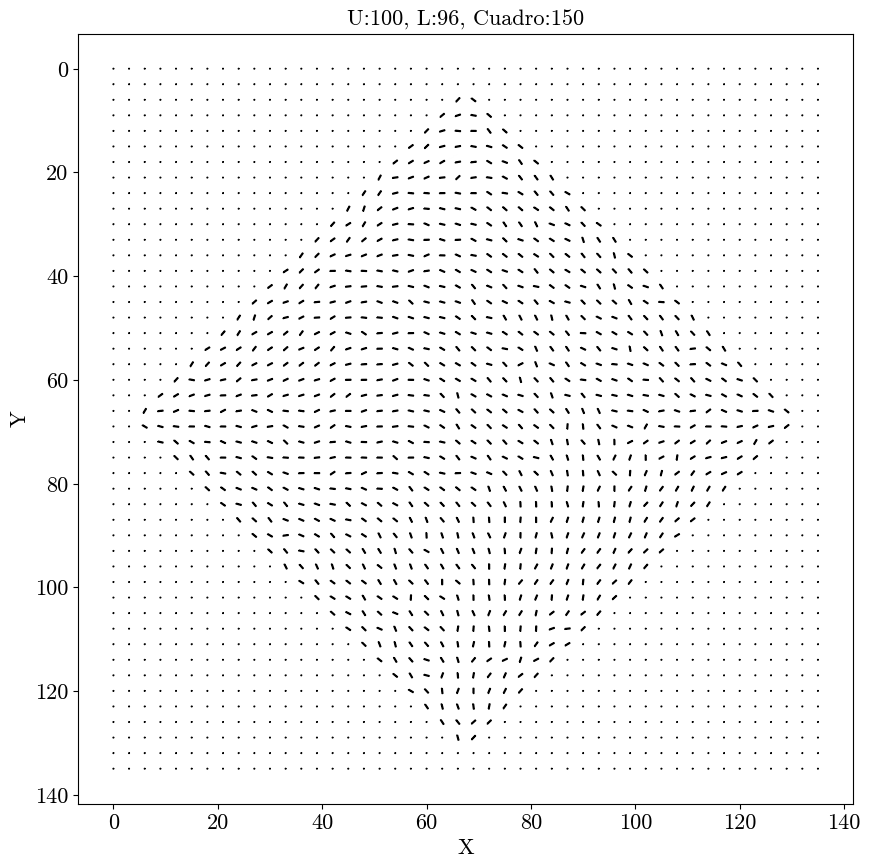

In [ ]:

frame = 150
file_name = "../Data/MAI_U040_L_128_A/mpcd_{}.vtk".format(frame)
tipo = "v"

eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name, pad_width=4)
winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
winding_numbers *= -1
centroids = pf.find_candidates_by_winding_number(winding_numbers)


predictions_df = pd.DataFrame()
#defects = np.array([[i,j] for i in range(3,eigen_vals.shape[0]-3) for j in range(3,eigen_vals.shape[1]-3)])
defects = np.round([(c[1], c[0]) for c in centroids]).astype(int)
predictions = pf.predict_field(model, eigen_vals, eigen_vecs, defects, device=device, filename=f"w")
_x, _y = [sample.position[0] for sample in predictions], [sample.position[1] for sample in predictions]
_labels = [sample.pseudo_label for sample in predictions]
_confidence = [sample.pseudo_label_confidence for sample in predictions]
predictions_df= pd.DataFrame(list(zip(_x,_y, _labels, _confidence)),columns=["x","y","prediction","confidence"])

plt.figure(figsize=(10,10))

# Plot the heatmap of winding numbers
if tipo == "w":
    sns.heatmap(winding_numbers, cmap="viridis", cbar=False)
    plt.gca().invert_yaxis()

# Overlay the vector field using quiver
x, y = np.meshgrid(np.arange(eigen_vecs.shape[1]), np.arange(eigen_vecs.shape[0]))
U = eigen_vecs[:, :, 0]
V = eigen_vecs[:, :, 1]

j = 3

# Normal vector field
plt.quiver(
        x[::j, ::j], 
        y[::j, ::j], 
        U[::j, ::j], 
        V[::j, ::j], 
        color='white', 
        scale=1, 
        scale_units='xy', 
        angles='xy', 
        headlength=0, 
        headwidth=1, 
        width=0.001, 
        linewidth=1, 
        edgecolor='white' if tipo == "w" else 'black',
        pivot='mid'
        )

# Red Crosses
# for index, row in predictions_df.iterrows():
#     if row["prediction"] != 3:
#         plt.plot(
#             row["x"], row["y"],
#             'rP',
#             markersize=5,
#         )

# CNN Predictions
if tipo == "cnn":
    for index, row in predictions_df.iterrows():
        plt.plot(
            row["x"], row["y"],
            marker='o',
            markersize=30,
            markerfacecolor='none',
            markeredgewidth=5,  # adjust as needed
            markeredgecolor='blue' if row["prediction"] == 0 else 'red' if row["prediction"] == 1 else 'black'
        )

plt.gca().invert_yaxis()
plt.xlabel('X')
plt.ylabel('Y')
plt.title(f"U:100, L:96, Cuadro:{frame}")
plt.savefig(f"../Plots/U100_L096_A/251008_{frame}_{tipo}", dpi=300, bbox_inches='tight')


In [12]:

def save_prediction_frame(file_name, output_name, model, device):

    eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name, pad_width=4)
    winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
    winding_numbers *= -1
    centroids = pf.find_candidates_by_winding_number(winding_numbers)


    predictions_df = pd.DataFrame()
    #defects = np.array([[i,j] for i in range(3,eigen_vals.shape[0]-3) for j in range(3,eigen_vals.shape[1]-3)])
    defects = np.round([(c[1], c[0]) for c in centroids]).astype(int)
    predictions = pf.predict_field(model, eigen_vals, eigen_vecs, defects, device=device, filename=f"w")
    _x, _y = [sample.position[0] for sample in predictions], [sample.position[1] for sample in predictions]
    _labels = [sample.pseudo_label for sample in predictions]
    _confidence = [sample.pseudo_label_confidence for sample in predictions]
    predictions_df= pd.DataFrame(list(zip(_x,_y, _labels, _confidence)),columns=["x","y","prediction","confidence"])

    plt.figure(figsize=(10,10))

    # Plot the heatmap of winding numbers
    sns.heatmap(winding_numbers, cmap="viridis", cbar=False)
    plt.gca().invert_yaxis()

    # Overlay the vector field using quiver
    x, y = np.meshgrid(np.arange(eigen_vecs.shape[1]), np.arange(eigen_vecs.shape[0]))
    U = eigen_vecs[:, :, 0]
    V = eigen_vecs[:, :, 1]

    j = 3

    plt.quiver(
            x[::j, ::j], 
            y[::j, ::j], 
            U[::j, ::j], 
            V[::j, ::j], 
            color='white', 
            scale=1, 
            scale_units='xy', 
            angles='xy', 
            headlength=0, 
            headwidth=1, 
            width=0.001, 
            linewidth=1, 
            edgecolor='white',
            pivot='mid'
            )

    for index, row in predictions_df.iterrows():
        if row["prediction"] != 3:
            plt.plot(
                row["x"], row["y"],
                'rP',
                markersize=5,
            )


    for index, row in predictions_df.iterrows():
        plt.plot(
            row["x"], row["y"],
            marker='o',
            markersize=30,
            markerfacecolor='none',
            markeredgewidth=5,  # adjust as needed
            markeredgecolor='blue' if row["prediction"] == 0 else 'red' if row["prediction"] == 1 else 'black'
        )

    plt.gca().invert_yaxis()
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.savefig(output_name, dpi=300, bbox_inches='tight')
    # plt.show()




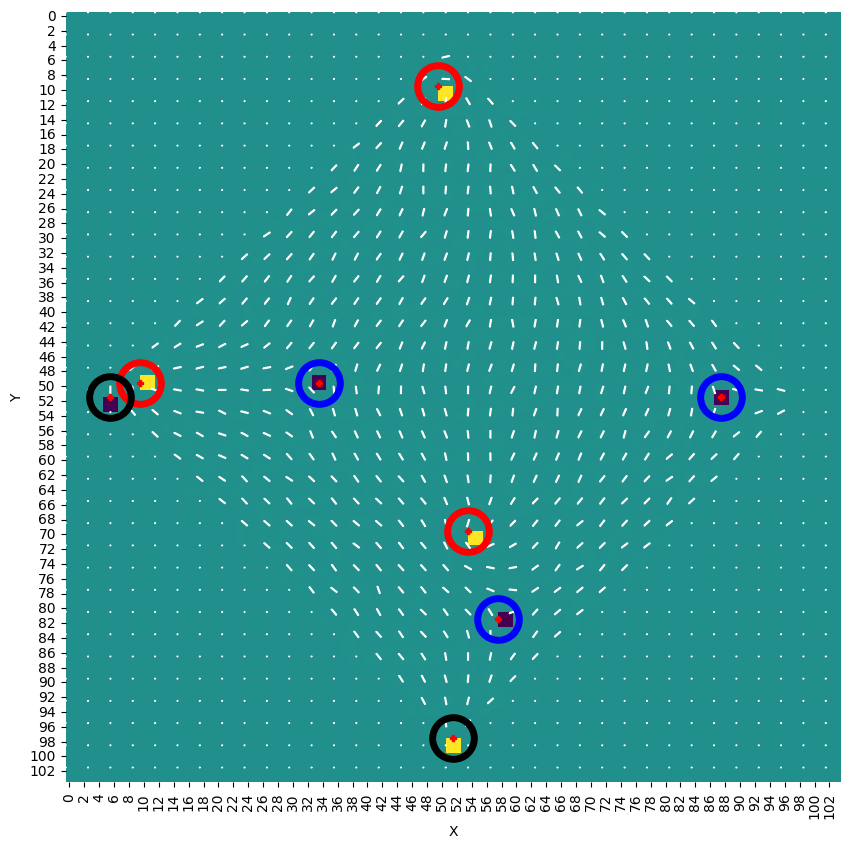

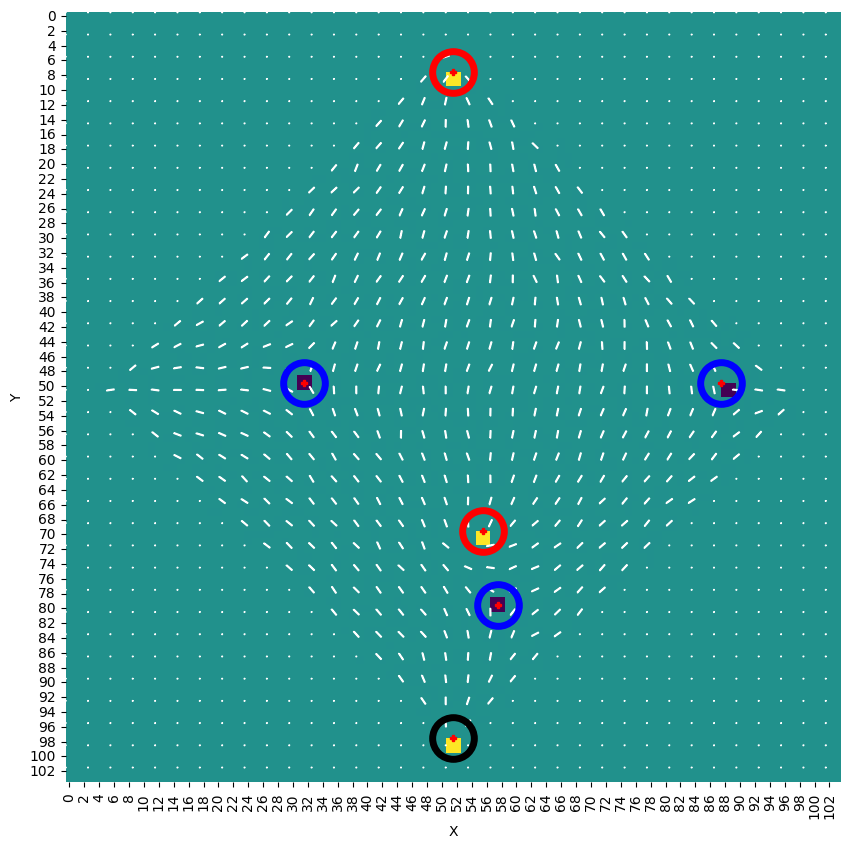

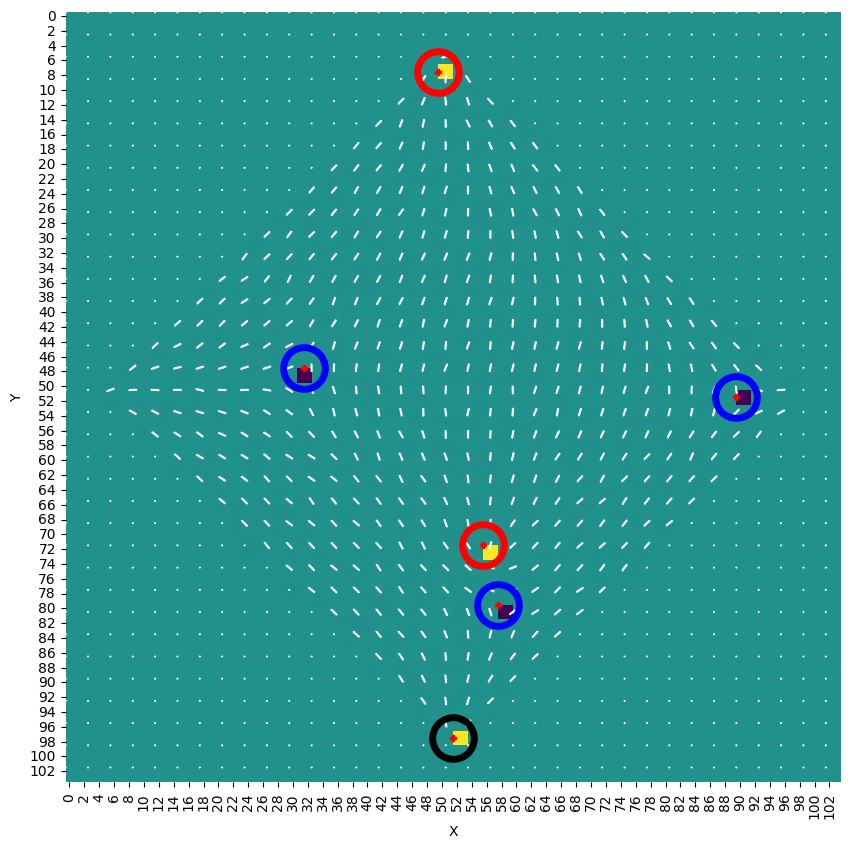

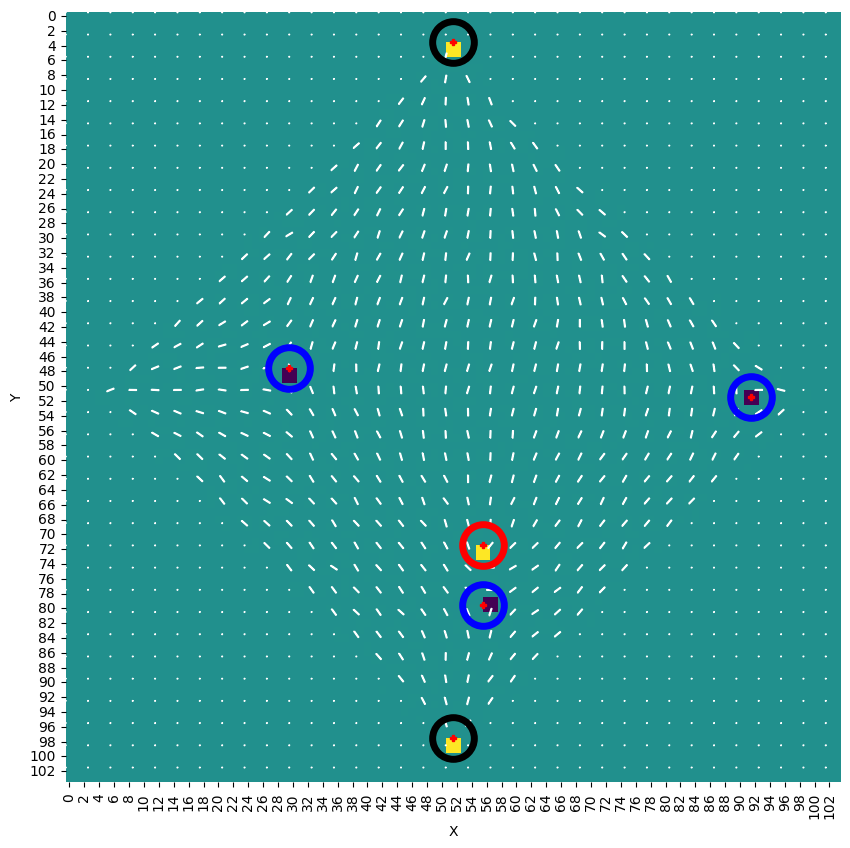

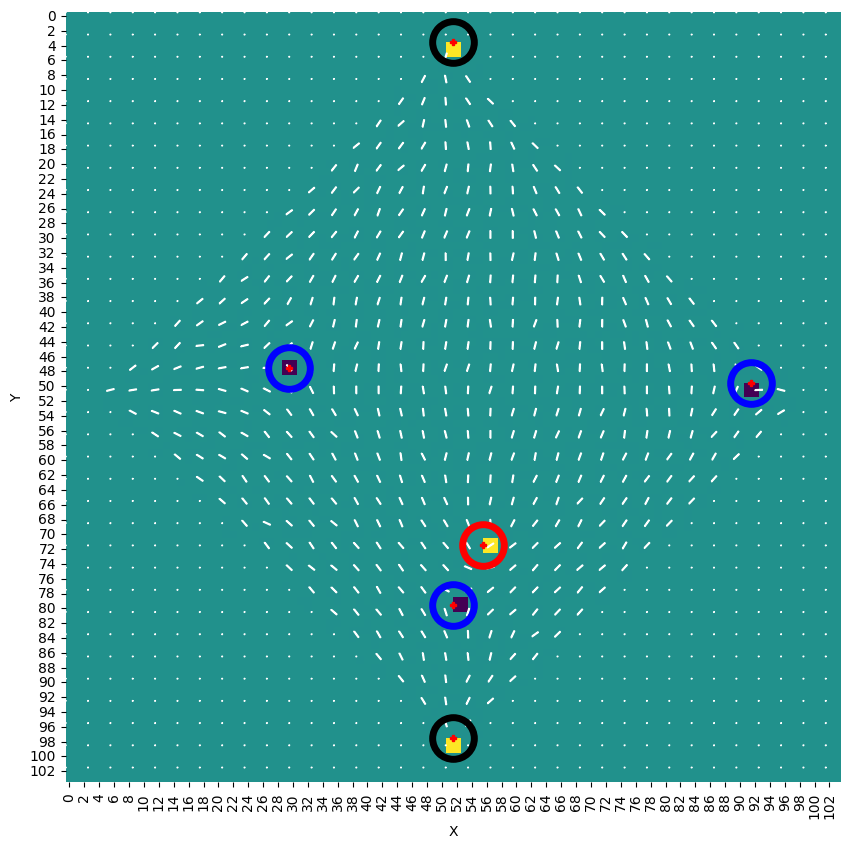

...

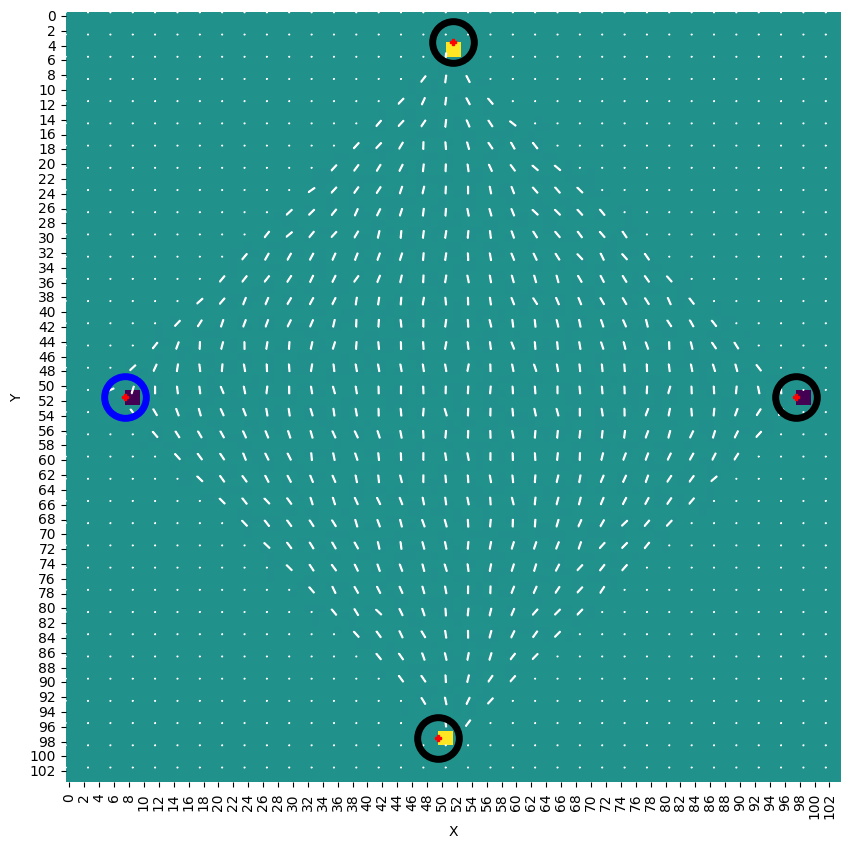

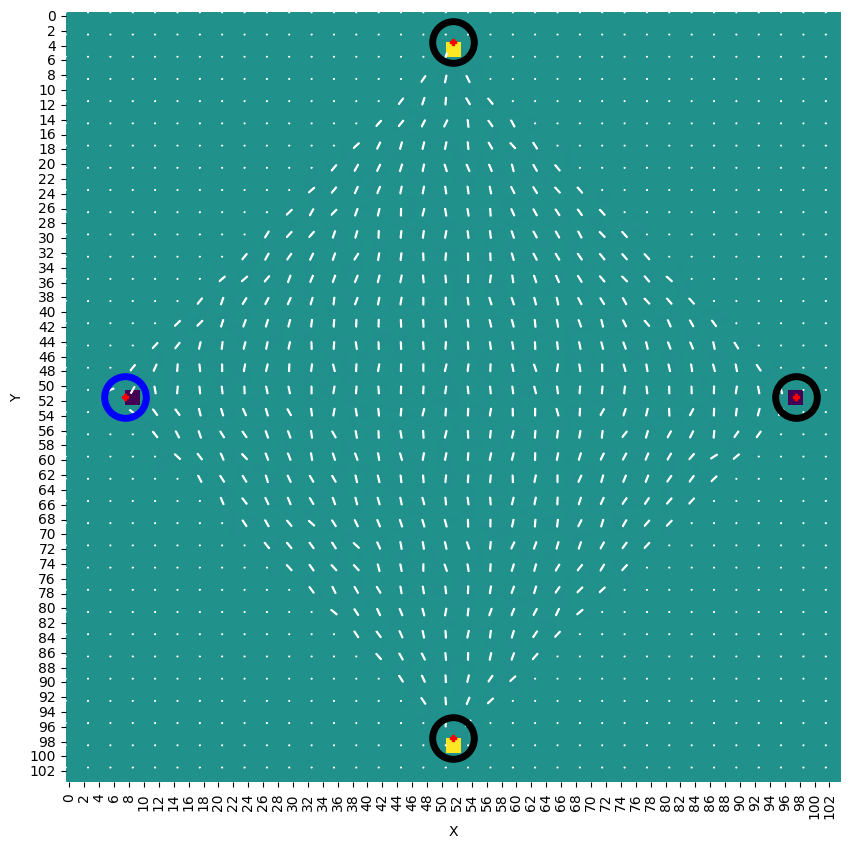

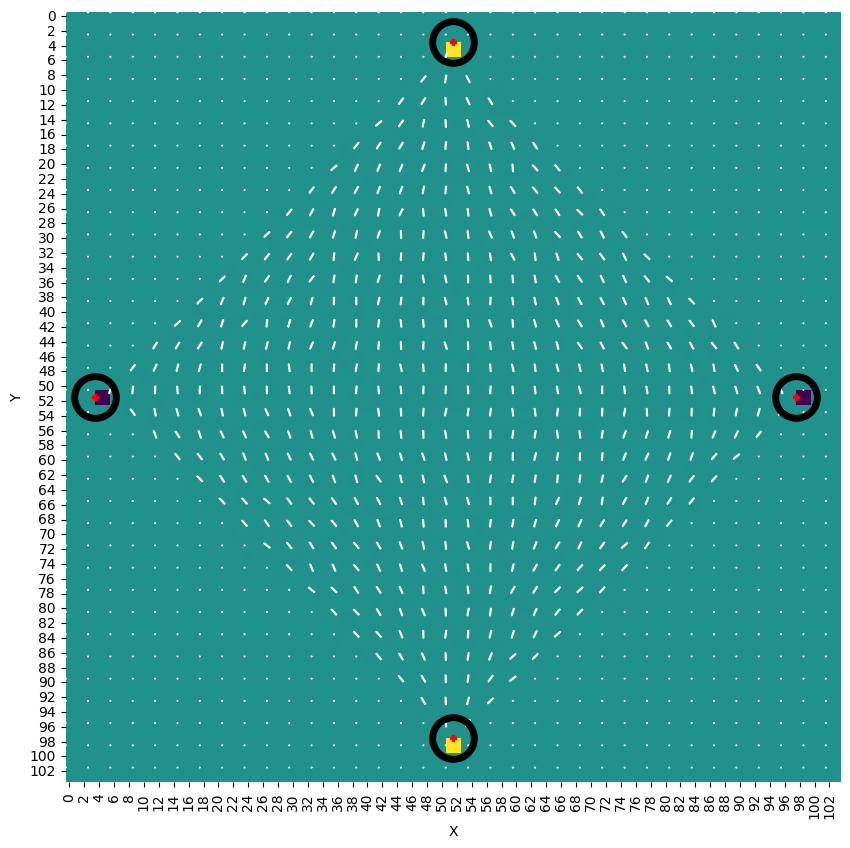

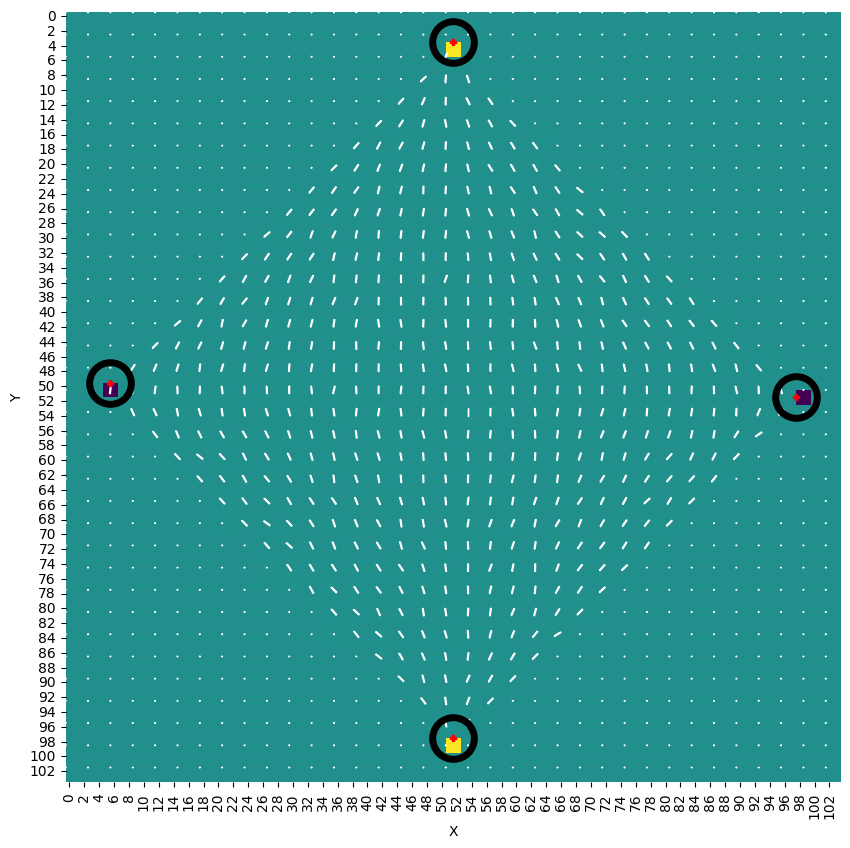

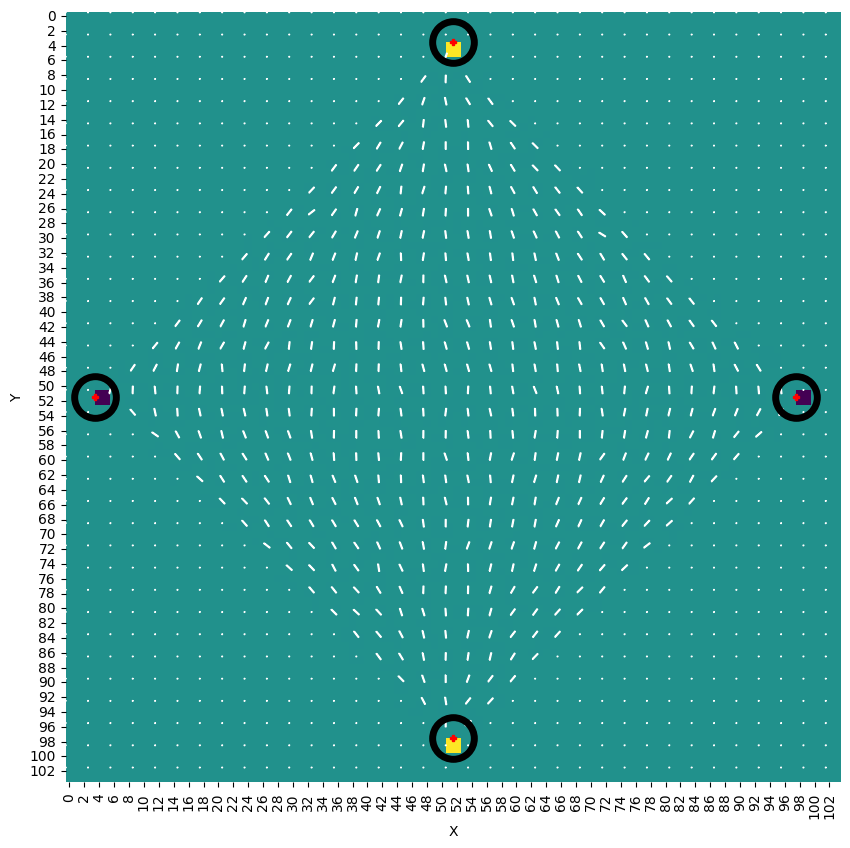

In [ ]:
# Saves the prediction of the model for a range of frames as a png image
model = pf.load_model(file_path="../Models/cnn_2025-08-12.pth")
device = "cuda"

for i in range(5, 50):
    file_name = "../Data/MAI_U100_L_096_A/mpcd_{}.vtk".format(i)
    output_name = "../Plots/U100_L096_A/{:03d}.png".format(i)
    save_prediction_frame(file_name, output_name, model, device)

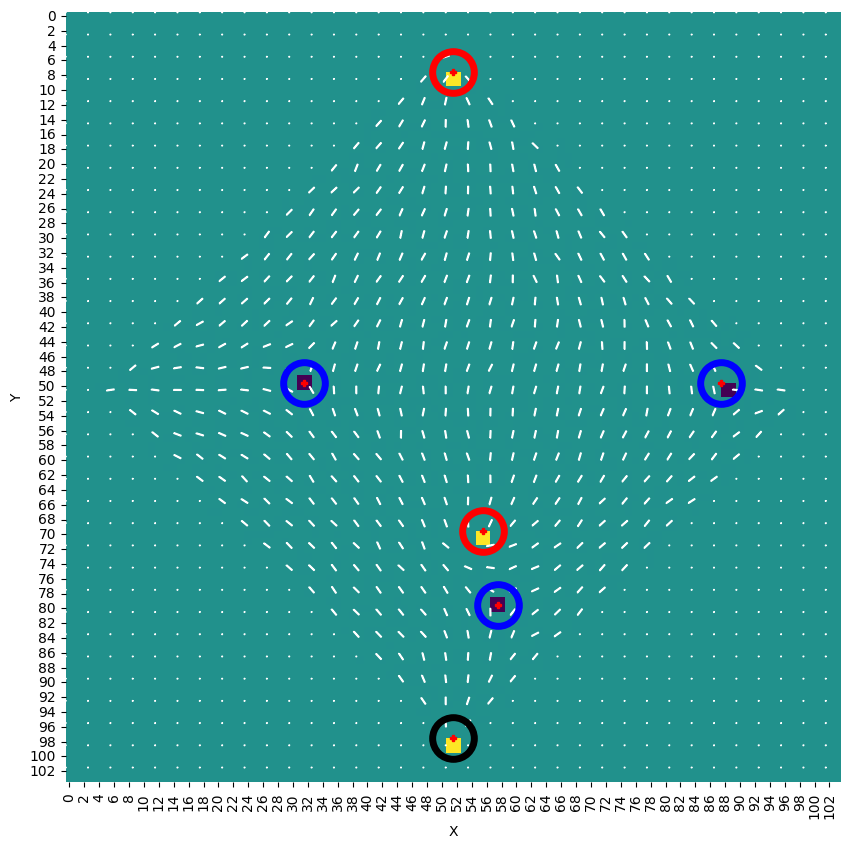

In [11]:
file_name = "../Data/MAI_U100_L_096_A/mpcd_6.vtk"

eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name, pad_width=4)
winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
winding_numbers *= -1
centroids = pf.find_candidates_by_winding_number(winding_numbers)


predictions_df = pd.DataFrame()
#defects = np.array([[i,j] for i in range(3,eigen_vals.shape[0]-3) for j in range(3,eigen_vals.shape[1]-3)])
defects = np.round([(c[1], c[0]) for c in centroids]).astype(int)
predictions = pf.predict_field(model, eigen_vals, eigen_vecs, defects, device=device, filename=f"w")
_x, _y = [sample.position[0] for sample in predictions], [sample.position[1] for sample in predictions]
_labels = [sample.pseudo_label for sample in predictions]
_confidence = [sample.pseudo_label_confidence for sample in predictions]
predictions_df= pd.DataFrame(list(zip(_x,_y, _labels, _confidence)),columns=["x","y","prediction","confidence"])




plt.figure(figsize=(10,10))

# Plot the heatmap of winding numbers
sns.heatmap(winding_numbers, cmap="viridis", cbar=False)
plt.gca().invert_yaxis()

# Overlay the vector field using quiver
x, y = np.meshgrid(np.arange(eigen_vecs.shape[1]), np.arange(eigen_vecs.shape[0]))
U = eigen_vecs[:, :, 0]
V = eigen_vecs[:, :, 1]

j = 3

plt.quiver(
        x[::j, ::j], 
        y[::j, ::j], 
        U[::j, ::j], 
        V[::j, ::j], 
        color='white', 
        scale=1, 
        scale_units='xy', 
        angles='xy', 
        headlength=0, 
        headwidth=1, 
        width=0.001, 
        linewidth=1, 
        edgecolor='white',
        pivot='mid'
        )

for index, row in predictions_df.iterrows():
    if row["prediction"] != 3:
        plt.plot(
            row["x"], row["y"],
            'rP',
            markersize=5,
        )


for index, row in predictions_df.iterrows():
    plt.plot(
        row["x"], row["y"],
        marker='o',
        markersize=30,
        markerfacecolor='none',
        markeredgewidth=5,  # adjust as needed
        markeredgecolor='blue' if row["prediction"] == 0 else 'red' if row["prediction"] == 1 else 'black'
    )


# window_size= 9
# c_x = 48
# c_y = 42
# plt.xlim(c_x - window_size, c_x + window_size)
# plt.ylim(c_y - window_size, c_y + window_size)

plt.gca().invert_yaxis()
plt.xlabel('X')
plt.ylabel('Y')
plt.show()




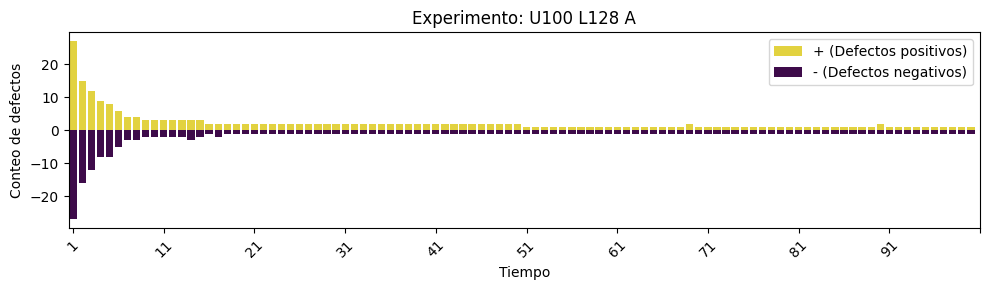

In [ ]:
## Timeline of the number of defects for the first 100 frames with the CNN Filter

frames = range(1,101)
file_name = "../Data/MAI_U100_L_128_A/mpcd_{}.vtk"

predictions_df = pd.DataFrame(columns=["x","y","prediction","confidence","tag","frame"])


for frame in frames:
    try:
        eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name.format(frame), pad_width=4)
    except:
        print(f"File not found: {file_name.format(frame)}")
        continue

    winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
    winding_numbers *= -1

    centroids = pf.find_candidates_by_winding_number(winding_numbers)
    defects = np.round([(c[1], c[0]) for c in centroids]).astype(int)
    predictions = pf.predict_field(model, eigen_vals, eigen_vecs, defects, device=device, filename=f"w")
    _x, _y = [sample.position[0] for sample in predictions], [sample.position[1] for sample in predictions]
    _labels = [sample.pseudo_label for sample in predictions]
    _confidence = [sample.pseudo_label_confidence for sample in predictions]
    _tag = [f"U100 L128 A" for _ in range(len(_x))]
    _frame = [frame for _ in range(len(_x))]

    predictions_df = pd.concat([predictions_df, pd.DataFrame(list(zip(_x,_y, _labels, _confidence, _tag, _frame )),columns=["x","y","prediction","confidence","tag","frame"])])

predictions_df["frame"] = predictions_df["frame"].astype(int)

pf.plot_experiments_evolution(predictions_df)


In [32]:
file_name = "../Data/MAI_U100_L_128_A/mpcd_90.vtk"

eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name, pad_width=4)
winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
winding_numbers *= -1

x = np.arange(eigen_vecs.shape[0])
y = np.arange(eigen_vecs.shape[1])
X, Y = np.meshgrid(x, y)

# Extract x and y components of eigenvectors
U = eigen_vecs[:,:,0]
V = eigen_vecs[:,:,1]

# Create quiver plot with plotly
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=X.flatten(),
    y=Y.flatten(),
    mode='markers',
    marker=dict(
        symbol='diamond-wide',
        line_width=0,
        line_color=winding_numbers.flatten(),
        line_colorscale='Viridis',
        angle=90 + np.arctan2(V.flatten(), U.flatten()) * 180 / np.pi,
        size=30,  # Reduced size for better visualization
        color=winding_numbers.flatten(),
        colorscale='Viridis',
        colorbar=dict(title='Numero de giro'),
        showscale=False
    ),
    name='Eigenvector Field',
    text=np.arctan2(V.flatten(), U.flatten()),
    hovertemplate='Angle: %{text:.2f}<extra></extra>',
))

fig.update_layout(
    xaxis_title='X',
    yaxis_title='Y',
    width=800,
    height=800,
    yaxis=dict(autorange='reversed'),
    template="plotly_white",
)

fig.show()

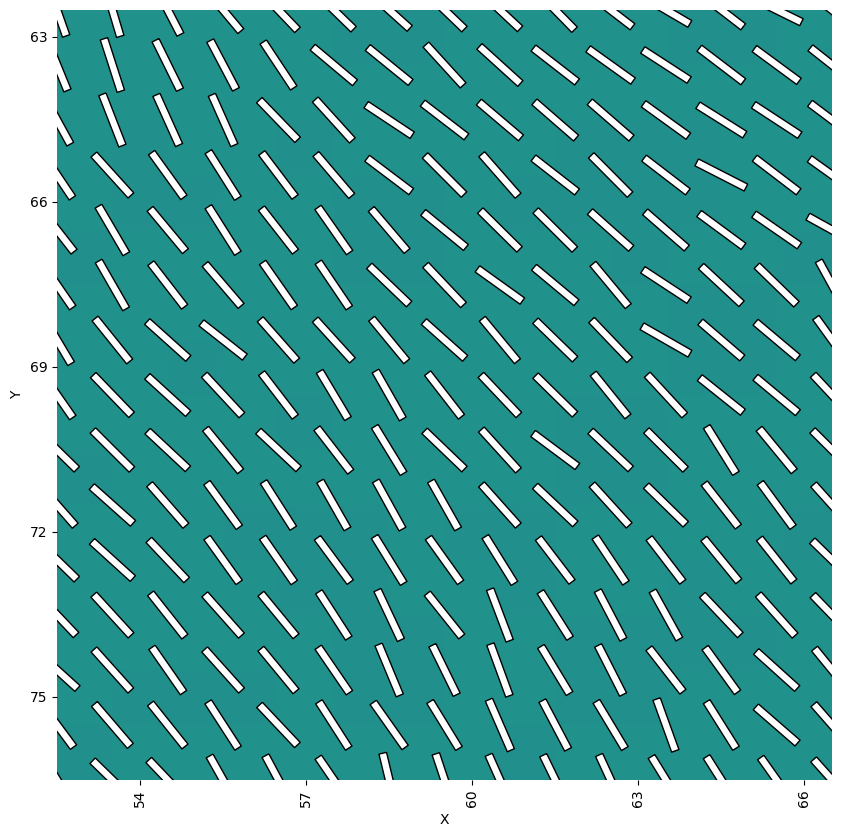

In [6]:
file_name = "../Data/MAI_U100_L_128_A/mpcd_90.vtk"

eigen_vals, eigen_vecs = pf.load_and_pad_vtk(file_name, pad_width=4)
winding_numbers, flips = pf.calculate_winding_number(eigen_vecs, pad_width=4)
winding_numbers *= -1

plt.figure(figsize=(10,10))
sns.heatmap(winding_numbers, cmap="viridis", cbar=False)
plt.xlim(120, 136)
plt.ylim(62, 78)
plt.gca().invert_yaxis()
plt.show()

x, y = np.meshgrid(np.arange(eigen_vecs.shape[1]), np.arange(eigen_vecs.shape[0]))
U = eigen_vecs[:, :, 0]
V = eigen_vecs[:, :, 1]
plt.quiver(
        x, y, U, V, 
        color='white', 
        scale=1, 
        scale_units='xy', 
        angles='xy', 
        headlength=0, 
        headwidth=1, 
        width=0.01, 
        linewidth=1, 
        edgecolor='black',
        pivot='mid'
        )

window_size= 7
c_x = 60
c_y = 70

plt.xlim(c_x - window_size, c_x + window_size)
plt.ylim(c_y - window_size, c_y + window_size)
plt.gca().invert_yaxis()
plt.xlabel('X')
plt.ylabel('Y')
plt.show()